In [1]:
import numpy as np
from matplotlib import pyplot
import cv2
from colour_demosaicing import demosaicing_CFA_Bayer_bilinear
from PIL import Image
import os
import json
from importlib.machinery import SourceFileLoader

from utils.utils import *
from utils.init import init_inference
from models.forward import *

import torch
import torchvision
import torch.optim as optim

## Helper functions

In [2]:
def load_tiff(file_name, trim_edge = True):
    file_name = file_name.replace('_1.tif','')
    frame1 = np.array(Image.open(file_name+'_1.tif'),dtype='f')
    frame2 = np.array(Image.open(file_name+'_2.tif'),dtype='f')
    if trim_edge:
        frame1 = frame1[714:-716,1836:-1836]
        frame2 = frame2[714:-716,1836:-1836]
    capture_sum = frame1
    if np.max(capture_sum) >= 2**14-513:
        print('capture over-exposed')
        
    mask = (frame1 - frame2 <= 512) & (frame1 > 2**13)
    capture_l = np.where(mask, frame2, frame1 - frame2)
    capture_r = frame2 
    
    return file_name, capture_sum, capture_l, capture_r

def crop(image, size, start_h, start_w):
    if size == 0:
        return image
    else:
        return image[start_h:start_h + size, start_w:start_w + size]

def vis(image, mode = 'rgb', scale=1, gamma=1):
    pyplot.figure(figsize = (20,5))
    if mode == 'rgb':
        demosaiced = demosaicing_CFA_Bayer_bilinear(image, pattern="RGGB")
        print(np.sum(demosaiced,(0,1)))
        # gray world assumption white balance
        demosaiced[:,:,0] = demosaiced[:,:,0]/demosaiced[:,:,0].mean()
        demosaiced[:,:,1] = demosaiced[:,:,1]/demosaiced[:,:,1].mean()
        demosaiced[:,:,2] = demosaiced[:,:,2]/demosaiced[:,:,2].mean()
        demosaiced /= 256
        print("max value: ",np.max(demosaiced))
        pyplot.imshow((scale*demosaiced)**gamma)
        return demosaiced
    elif mode == 'raw':
        image_log = np.log1p(image)
        pyplot.imshow(image_log, cmap="gray",vmax = 10)
        pyplot.colorbar()
        return image_log

def linear_cleanup(capture_sum, capture_r, l2r, r2r):
    mask = capture_sum > 13
    capture_sum *= mask
    capture_r *= mask
    
    mask = (capture_sum - capture_r <= 512) & (capture_sum > 2**13)
    
    capture_sum = np.where(mask, capture_r * 2, capture_sum)
    
    capture_r = 1 / r2r * capture_r
    l2r = 1 / r2r * l2r
    capture_l_clean = (capture_sum - capture_r) / (1 - l2r)
    capture_r_clean = capture_sum - capture_l_clean
    capture_l_clean = np.where(mask, np.zeros_like(capture_l_clean), capture_l_clean)
    return capture_l_clean, capture_r_clean, mask

def Bayer2RGB(raw):
    # duplicate values without proper demosaicing
    H, W = raw.shape
    demosaiced = np.zeros((H,W,3))
    demosaiced[::2,::2,0] = raw[::2,::2]
    demosaiced[0::2,1::2,1] = raw[0::2,1::2]
    demosaiced[1::2,0::2,1] = raw[1::2,0::2]
    demosaiced[1::2,1::2,2]= raw[1::2,1::2]
    return demosaiced

def process(capture_sum_raw, capture_r_raw, l2r, r2r, wb_l = None, wb_r = np.array([1,1,1]), scale=None, plot = True, demosaicing = True, rot90 = False):
    capture_l, capture_r, mask = linear_cleanup(capture_sum_raw, capture_r_raw, l2r, r2r)
    
    bayer_pattern = "RGGB"
    
    if not demosaicing:
        capture_l_demosaiced = Bayer2RGB(capture_l) / 256
        capture_r_demosaiced = Bayer2RGB(capture_r) / 256
    else:
        capture_l_demosaiced = demosaicing_CFA_Bayer_bilinear(capture_l, pattern=bayer_pattern)/ 256
        capture_r_demosaiced = demosaicing_CFA_Bayer_bilinear(capture_r, pattern=bayer_pattern)/ 256
    
    if wb_l is None:
        r_mean = (capture_l_demosaiced)[:,:,0].mean()
        g_mean = (capture_l_demosaiced)[:,:,1].mean()
        b_mean = (capture_l_demosaiced)[:,:,2].mean()
    else:
        [r_mean,g_mean,b_mean] = wb_l
    
    
    capture_r_demosaiced[:,:,0] = capture_r_demosaiced[:,:,0] / r_mean * wb_r[0]
    capture_r_demosaiced[:,:,1] = capture_r_demosaiced[:,:,1] / g_mean * wb_r[1]
    capture_r_demosaiced[:,:,2] = capture_r_demosaiced[:,:,2] / b_mean * wb_r[2]
    
    capture_l_demosaiced[:,:,0] = capture_l_demosaiced[:,:,0] / r_mean
    capture_l_demosaiced[:,:,1] = capture_l_demosaiced[:,:,1] / g_mean
    capture_l_demosaiced[:,:,2] = capture_l_demosaiced[:,:,2] / b_mean
    
    capture_l_demosaiced = np.where(mask[...,None], np.zeros_like(capture_r_demosaiced), capture_l_demosaiced)
    
    if rot90:
        capture_l_demosaiced = np.rot90(capture_l_demosaiced)
        capture_r_demosaiced = np.rot90(capture_r_demosaiced)
    
    if scale is None:
        max_val = np.percentile(capture_l_demosaiced, 99)
        scale = 0.5/max_val
        
    if plot:
        pyplot.figure(figsize = (20,10))
        pyplot.imshow((2 * scale*np.concatenate([capture_l_demosaiced, capture_r_demosaiced],1)))
        pyplot.axis("off")
    
    return scale*capture_l_demosaiced, scale*capture_r_demosaiced, [r_mean,g_mean,b_mean]

def wvl2RGB(image, wvl, gamma):
    
    wvl = np.clip(wvl, 380, 780)
    image = np.clip(image, 0, 1)
    if wvl >=380 and wvl <450:
        r = -1.0 * (wvl - 450.0) / (450.0 - 380.0)
        g = 0
        b = 1.0
    elif wvl >=450 and wvl <500:
        r = 0
        g = (wvl - 450.0) / (500.0 - 450.0)
        b = 1.0
    elif wvl >=500 and wvl <550:
        r = 0
        g = 1.0
        b = -1.0 * (wvl - 550.0) / (550.0 - 500.0)
    elif wvl >=550 and wvl <600:
        r = (wvl - 550.0) / (600.0 - 550.0)
        g = 1.0
        b = 0
    elif wvl >=600 and wvl <680:
        r = 1.0
        g = -1.0 * (wvl - 680.0) / (680.0 - 600.0)
        b = 0
    else:
        r = 1.0
        g = 0
        b = 0 

    if wvl > 700:
        sss = 0.3 + 0.7 * (780.0 - wvl) / (780.0 - 700.0)
    elif wvl < 420:  
        sss = 0.3 + 0.7 * (wvl - 380.0) / (420.0 - 380.0)
    else:
        sss = 1.0

    r = (sss*r)**gamma
    g = (sss*g)**gamma
    b = (sss*b)**gamma

    integ_rgb = r +g +b
    r = r / integ_rgb
    g = g / integ_rgb
    b = b / integ_rgb
    
    return np.stack([image * r,image * g, image * b],-1)

def HS2RGB(image_hs, wvls, gamma = 0.45):
    out = []
    for i in range(len(wvls)):
        out.append(wvl2RGB(image_hs[...,i], wvls[i], gamma))
    return np.stack(out,-1)

def viz_4x8result(image_rgb, image_hs, crop_x=0, crop_y=0, crop_size=None,gap = 12, wave_lengths = np.arange(400,701,10)):
    if crop_size is None:
        crop_size = image_hs.shape[0]    
    canvas = np.ones([crop_size * 4 + gap * 3, crop_size * 8 + gap * 7, 3])
    matrix = np.arange(32).reshape(4, 8)
    
    image_hs_plot = HS2RGB(image_hs, wave_lengths)
    crop_hs = image_hs_plot[crop_x:crop_x + crop_size,crop_y:crop_y+crop_size]
    
    canvas[:crop_size, :crop_size] = image_rgb[crop_x:crop_x + crop_size,crop_y:crop_y+crop_size]
    
    for i in range(31):
        row_index, col_index = np.where(matrix == (i+ 1))
        row_start = (row_index * crop_size + row_index * gap)[0]
        column_start = (col_index * crop_size + col_index * gap)[0]
        canvas[row_start:row_start + crop_size, column_start:column_start + crop_size] = crop_hs[...,i]
    
    return np.clip(canvas,0,1)


## Load and preprocess capture

In [3]:
# crosstalk calibration and white balance calibration
l2r_fit = np.load('captures/l2r_fit.npy')
r2r_fit = np.load('captures/r2r_fit.npy')
wb_l = np.load('captures/wb_l.npy')
wb_r = np.load('captures/wb_r.npy')

/tmp/ipykernel_4068423/2426592077.py:38: RuntimeWarning: divide by zero encountered in log1p
  image_log = np.log1p(image)
/tmp/ipykernel_4068423/2426592077.py:38: RuntimeWarning: invalid value encountered in log1p
  image_log = np.log1p(image)


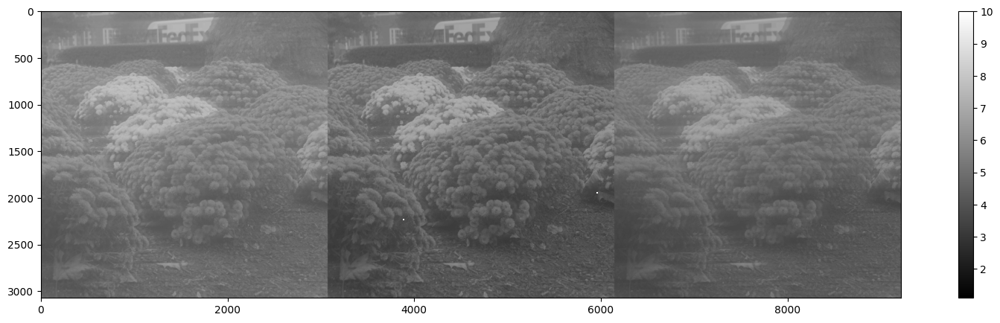

In [4]:
# load tif data and center crop to 3072x3072
file_name, capture_sum, capture_l, capture_r = load_tiff('captures/HS_S1_1.tif')
capture_sum_viz = vis(np.concatenate([capture_sum,capture_l, capture_r],-1), mode = 'raw', scale = 1, gamma = 1)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


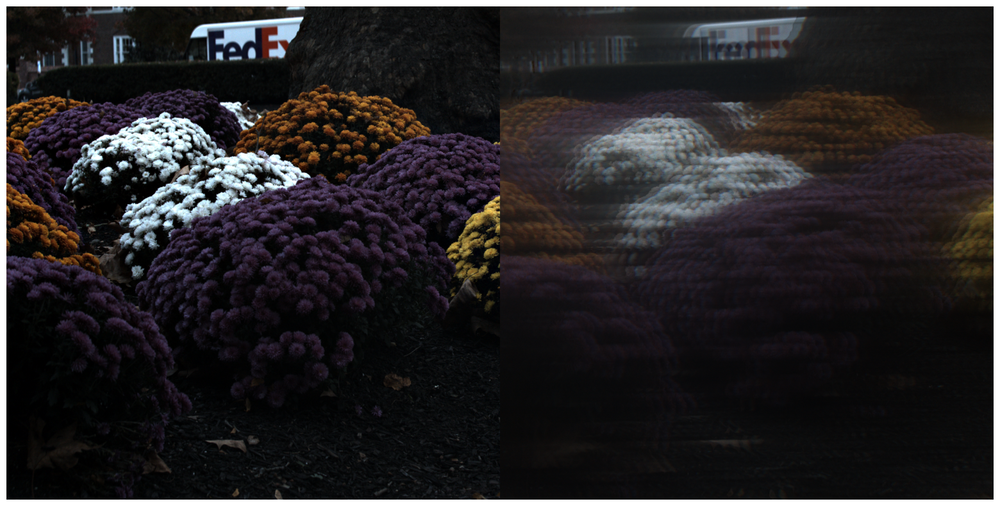

In [5]:
# crosstalk calibration, white balance and demosaicing
capture_l_proc, capture_r_proc,_ = process(capture_sum, capture_r,l2r_fit, r2r_fit, wb_l = wb_l, wb_r = wb_r)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


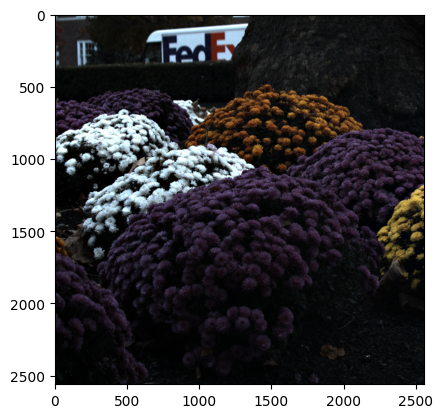

In [6]:
# (the cropping is optional if you have a big enough GPU that doesn't cry when handling a 3072x3072x31 input)
pyplot.imshow(2*capture_l_proc[:-512:, 512:])
np.savez(file_name+'.npz', ref=capture_l_proc[:-512:, 512:], enc=capture_r_proc[:-512:, 512:])

## Reconstruction

In [9]:
ckpt_path = 'ckpt/HS_experimetnal/'
args = json.load(open(os.path.join(ckpt_path,'args.json'),'r'))
args = AttributeDict(args)
param = SourceFileLoader("param", os.path.join(ckpt_path, args.param_file.split('/')[-1])).load_module()
args.pretrained_DOE = ckpt_path
args.pretrained_G = ckpt_path
args.train_optics = False
args.param = param
args.device = 'cuda' if torch.cuda.is_available() else 'cpu'
G = init_inference(args)

In [10]:
data = np.load('captures/HS_S1.npz')
capture_enc = data['enc']
capture_ref = data['ref']
capture_enc *= (np.mean(capture_ref,(0,1))/np.mean(capture_enc,(0,1)))[None,None:] # making sure the two side's whiteblance match up

In [11]:
padding = int((capture_enc.shape[0] - args.psf_l.shape[-1])/2)
psf_l = torchvision.transforms.Pad(padding)(args.psf_l)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(-0.5, 5119.5, 2559.5, -0.5)

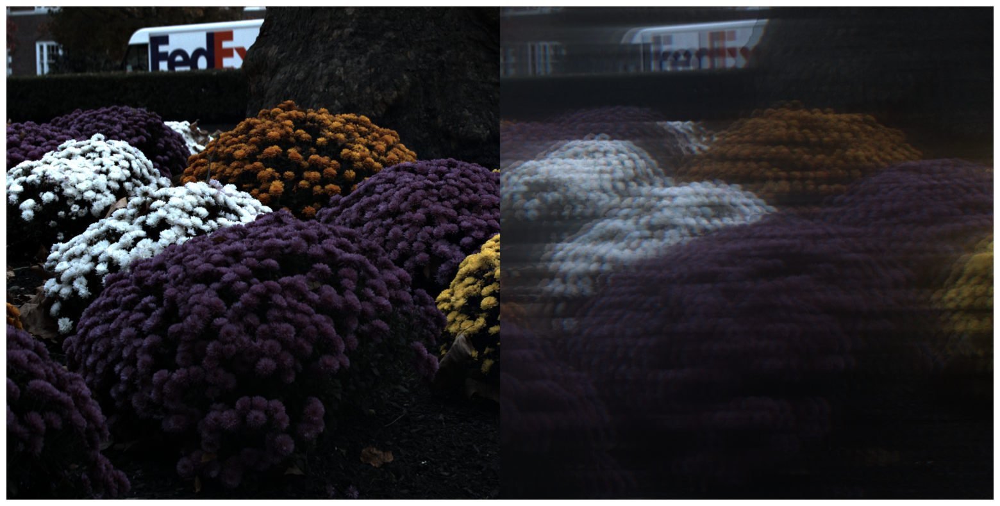

In [12]:
pyplot.figure(figsize = (20,10))
pyplot.imshow(2*np.concatenate([capture_ref, capture_enc],1))
pyplot.axis("off")

In [13]:
capture_enc_tensor = torch.from_numpy(capture_enc[None,...,[2,1,0]]).float().to(args.device).permute(0,3,1,2)
capture_ref_tensor = torch.from_numpy(capture_ref[None,...,[2,1,0]]).float().to(args.device).permute(0,3,1,2)
with torch.no_grad(): 
    out_spectral = G(capture_enc_tensor, capture_ref_tensor, psf_l)
    out_rgb = args.param.QE_conv_layer(out_spectral)[:,[2,1,0]]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(-0.5, 5119.5, 2559.5, -0.5)

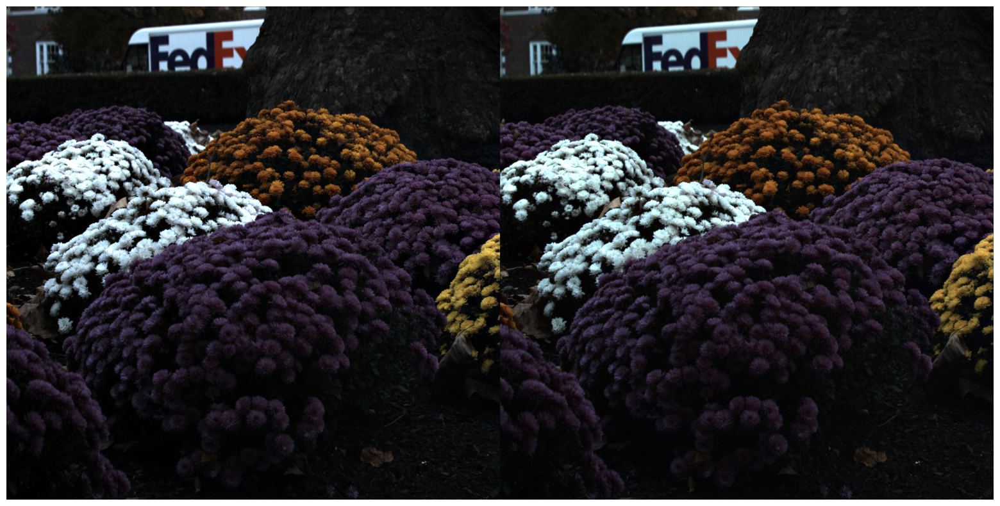

In [14]:
pyplot.figure(figsize = (20,10))
pyplot.imshow(np.concatenate([2*capture_ref, out_rgb[0].permute(1,2,0).detach().cpu()],1))
pyplot.axis("off")

In [16]:
# test-time refinement to close up the gap between simulation and real-world experiment

out_spectral_ = torch.clamp(out_spectral,0,1).clone()

HS = out_spectral.detach()

run = [0]

optimizer = optim.Adam([out_spectral_.requires_grad_()], lr=0.03)

out_rgb_ = args.param.QE_conv_layer(out_spectral_)
_, _, enc_preclamp_ = image_formation(args.psf_l, torchvision.transforms.Pad(padding)(args.psf_r), out_spectral_, args, None)

enc_loss = torch.mean(torch.abs(enc_preclamp_ - capture_enc_tensor))
ref_loss = torch.mean(torch.abs(out_rgb_ - 2*capture_ref_tensor))

print('Enc Loss : {:4f} Ref Loss: {:4f} '.format(enc_loss.item(), ref_loss.item()))

while run[0] <= 50:
    optimizer.zero_grad()
    out_rgb_ = args.param.QE_conv_layer(out_spectral_)
    _, _, enc_preclamp_ = image_formation(args.psf_l, torchvision.transforms.Pad(padding)(args.psf_r), out_spectral_, args, None)
    
    enc_loss = torch.mean(torch.abs(enc_preclamp_ - capture_enc_tensor))
    ref_loss = torch.mean(torch.abs(out_rgb_ - 2*capture_ref_tensor))
    
    loss = ref_loss + 0.1 * enc_loss # since the psf calibration is not perfect, we use smaller weight on the enc_loss and treat it more like a reg to make sure the method doesn't default back to RGB2HS 
    loss.backward()
    optimizer.step()
    
    run[0] += 1      
    if run[0] % 10 == 0:
        print("run {}:".format(run))
        print('Enc Loss : {:4f} Ref Loss: {:4f} '.format(enc_loss.item(), ref_loss.item()))


Enc Loss : 0.026291 Ref Loss: 0.014216 
run [10]:
Enc Loss : 0.026267 Ref Loss: 0.004830 
run [20]:
Enc Loss : 0.026169 Ref Loss: 0.002771 
run [30]:
Enc Loss : 0.026136 Ref Loss: 0.001838 
run [40]:
Enc Loss : 0.026116 Ref Loss: 0.001364 
run [50]:
Enc Loss : 0.026098 Ref Loss: 0.001117 


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


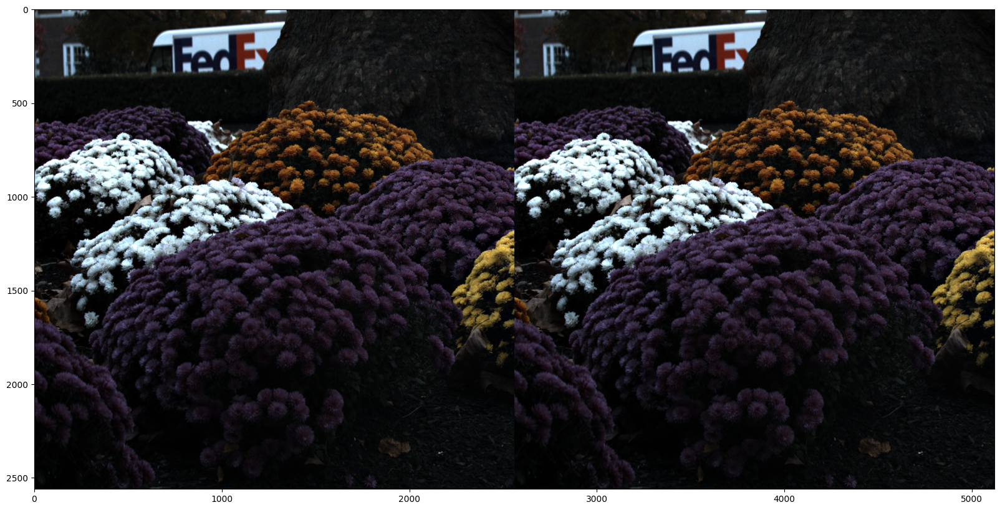

In [17]:
pyplot.figure(figsize = (20,10))
pyplot.imshow(np.concatenate([2*capture_ref, out_rgb_[0,[2,1,0]].permute(1,2,0).detach().cpu()],1))

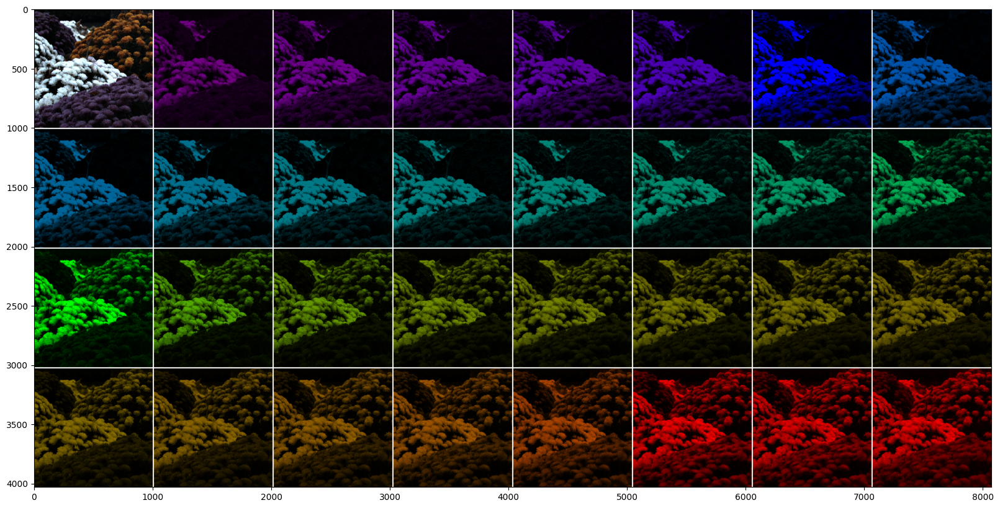

In [18]:
ours_viz =viz_4x8result(out_rgb_[0,[2,1,0]].permute(1,2,0).detach().cpu(), out_spectral_[0].permute(1,2,0).detach().cpu().numpy(), crop_x=500, crop_y=600, crop_size=1000, gap = 10)
pyplot.figure(figsize=(20,10))
pyplot.imshow(ours_viz)